In [2]:
from fastai import *
from fastai.vision import *
from fastai.metrics import error_rate
import numpy as np
from pathlib import Path

In [28]:
import os
os.getcwd()

'/cache/home/jz704'

In [4]:
path0=Path("/scratch/kp807/giraffes/train")
img_folder=Path("/projects/datasets/ecology/wild_watch_kenya/serengeti/S2/B04/B04_R1")

### Load dataset (just a placeholder)

In [7]:
np.random.seed(42)
data = ImageDataBunch.from_folder(path0, train=".", valid_pct=0.2,
        ds_tfms=get_transforms(), size=224, num_workers=4).normalize(imagenet_stats)   # three is no test data set here

### Load Model

In [8]:
learn=create_cnn(data, models.resnet34, metrics=error_rate)
learn.load("stage-2") # trained model

Learner(data=ImageDataBunch;

Train: LabelList
y: CategoryList (98701 items)
[Category buffalo, Category buffalo, Category buffalo, Category buffalo, Category buffalo]...
Path: /scratch/kp807/giraffes/train
x: ImageItemList (98701 items)
[Image (3, 300, 400), Image (3, 300, 400), Image (3, 300, 400), Image (3, 300, 400), Image (3, 300, 400)]...
Path: /scratch/kp807/giraffes/train;

Valid: LabelList
y: CategoryList (24675 items)
[Category giraffe, Category lionFemale, Category gazelleThomsons, Category empty, Category otherBird]...
Path: /scratch/kp807/giraffes/train
x: ImageItemList (24675 items)
[Image (3, 300, 400), Image (3, 300, 400), Image (3, 300, 400), Image (3, 300, 400), Image (3, 300, 400)]...
Path: /scratch/kp807/giraffes/train;

Test: None, model=Sequential(
  (0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
  

### Predict

In [9]:
img = open_image(img_folder/'S2_B04_R1_IMAG0190.JPG')
prediction = learn.predict(img)

In [10]:
prediction

(Category zebra,
 tensor(46),
 tensor([3.2598e-07, 4.8515e-06, 6.9013e-06, 2.6817e-06, 2.6527e-05, 1.0104e-08,
         1.3472e-07, 8.8216e-07, 1.2023e-06, 5.1624e-07, 3.5131e-08, 3.6482e-05,
         1.6650e-03, 4.8615e-05, 1.3300e-04, 2.9981e-07, 3.5666e-05, 8.0091e-04,
         2.8799e-06, 5.5334e-06, 1.0565e-07, 2.2967e-07, 2.5458e-06, 5.3434e-07,
         1.2749e-05, 4.4348e-07, 9.0709e-07, 6.8036e-07, 5.4806e-07, 6.0772e-07,
         5.9191e-05, 2.4586e-07, 1.7858e-04, 1.3924e-06, 1.9947e-06, 1.3325e-06,
         1.5347e-08, 2.5503e-07, 1.8499e-07, 6.7733e-06, 2.3055e-06, 5.7250e-07,
         3.4008e-05, 3.6425e-08, 1.2290e-07, 8.0115e-05, 9.9684e-01, 1.6299e-08]))

Prediction comprises three components:

- Category
- Order in the categories list
- confidence score for each category

In [16]:
import sys
sys.path.append("/cache/home/jz704")
import util

In [26]:
pred_list=util.score_output(prediction[2].tolist())

In [27]:
pred_list=pred_list[:5]
for pair in pred_list:
    print("Category:{}\tConfidence score:{}%".format(pair[0], pair[1]*100))

Category:zebra	Confidence score:99.68410851289194%
Category:empty	Confidence score:0.1664972069381997%
Category:guineaFowl	Confidence score:0.08009116960990847%
Category:otherBird	Confidence score:0.017857679848193385%
Category:gazelleThomsons	Confidence score:0.013299612489748366%


And the real image looks like this:

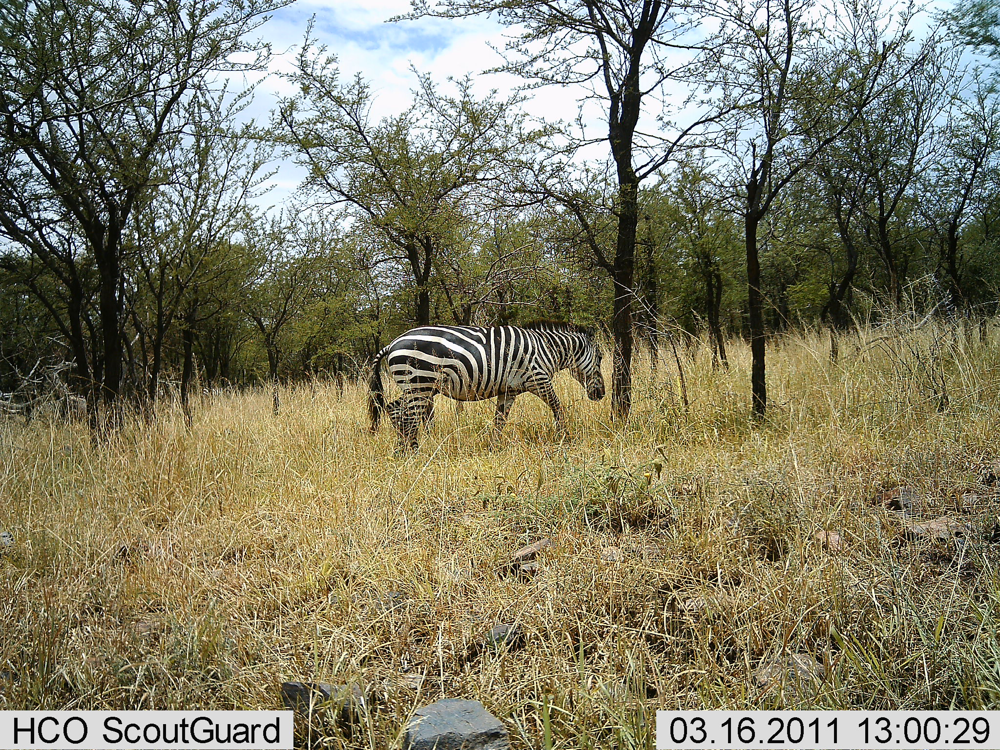

In [24]:
img